In [34]:
import os
import sys
import numpy as np
import torch
import ast
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [35]:
sys.path.append("../authorship_attribution/")
sys.path.append("../obfuscated_ast_similarity//")

In [36]:
import model as ast_model
import train as ast_train
import utilities as ast_utilities
import obfuscation
import json
import obfuscated_trainer

In [37]:
original_path = "../authorship_attribution/experiments/GCJ-108/plain/"

In [38]:
# complete_model = ast_utilities.load_plain_model(complete_model, )
# model_params = json.loads(open(os.path.join(path, "components", "ast_encoder_params.json")).read())
model_params = json.loads(open(os.path.join(original_path, "best_state", "components", "ast_encoder_params.json")).read())


In [39]:
ast_encoder = ast_model.ASTEncoder(model_params)
ast_encoder.load(os.path.join(original_path, "best_state", "components"))

In [7]:
batcher = obfuscated_trainer.Batcher({}, 0.8)
batcher.load_from_attribution_batcher(original_path)
# batcher.load_from_attribution_batcher("../authorship_attribution/experiments/GCJ-108/regularized-sep-coef-names/")
# batcher.load(original_path)

In [8]:
# batcher.train_data

In [9]:
# data = ast_utilities.read_all_gcj()

In [10]:
# data = ast_utilities.filter_by_count(data, 15, 1000)
# batcher = obfuscated_trainer.Batcher(data, 0.8)

In [11]:
# obfuscation_params = {
#     'add_kvargs':0.5,
#     'add_args':0.5,
#     'args_max_add':5,
#     'add_call_args':0.5,
#     'call_args':3,
#     'call_kwargs':3,
#     'if_swap':0.5,
#     'modify_body':0.5,
#     'n_modification_depth':3,
#     'max_trash_to_body':3,
#     'swap_in_body':0.5
# }

# obfuscation_params = {
#     'add_kvargs':0.8,
#     'add_args':0.8,
#     'args_max_add':8,
#     'add_call_args':0.8,
#     'call_args':5,
#     'call_kwargs':5,
#     'if_swap':0.7,
#     'modify_body':0.7,
#     'n_modification_depth':5,
#     'max_trash_to_body':5,
#     'swap_in_body':0.6
# }

# obfuscation_params = {
#     'add_kvargs':0.3,
#     'add_args':0.3,
#     'args_max_add':3,
#     'add_call_args':0.5,
#     'call_args':3,
#     'call_kwargs':3,
#     'if_swap':0.4,
#     'modify_body':0.4,
#     'n_modification_depth':2,
#     'max_trash_to_body':5,
#     'swap_in_body':0.5
# }

obfuscation_params = {
    'add_kvargs':0.3,
    'add_args':0.3,
    'args_max_add':10,
    'add_call_args':0.5,
    'call_args':10,
    'call_kwargs':10,
    'if_swap':0.5,
    'modify_body':0.4,
    'n_modification_depth':3,
    'max_trash_to_body':5,
    'swap_in_body':0.5
}


# obfuscation_params = {
#     'add_kvargs':0.0,
#     'add_args':0.0,
#     'args_max_add':0,
#     'add_call_args':0.0,
#     'call_args':0,
#     'call_kwargs':0,
#     'if_swap':0.0,
#     'modify_body':0.0,
#     'n_modification_depth':0,
#     'max_trash_to_body':0,
#     'swap_in_body':0.0
# }



In [42]:
# print()

In [12]:
long_names = obfuscated_trainer.order_names_by_count(batcher)

Train:
same_user 0.7069054325417131
same_problem_user 0.27886824703165297
same_user_original 0.9009108253267795
Test:
same_user 0.6598131158681617
same_problem_user 0.4298531624678414
same_user_original 0.8315822047473423


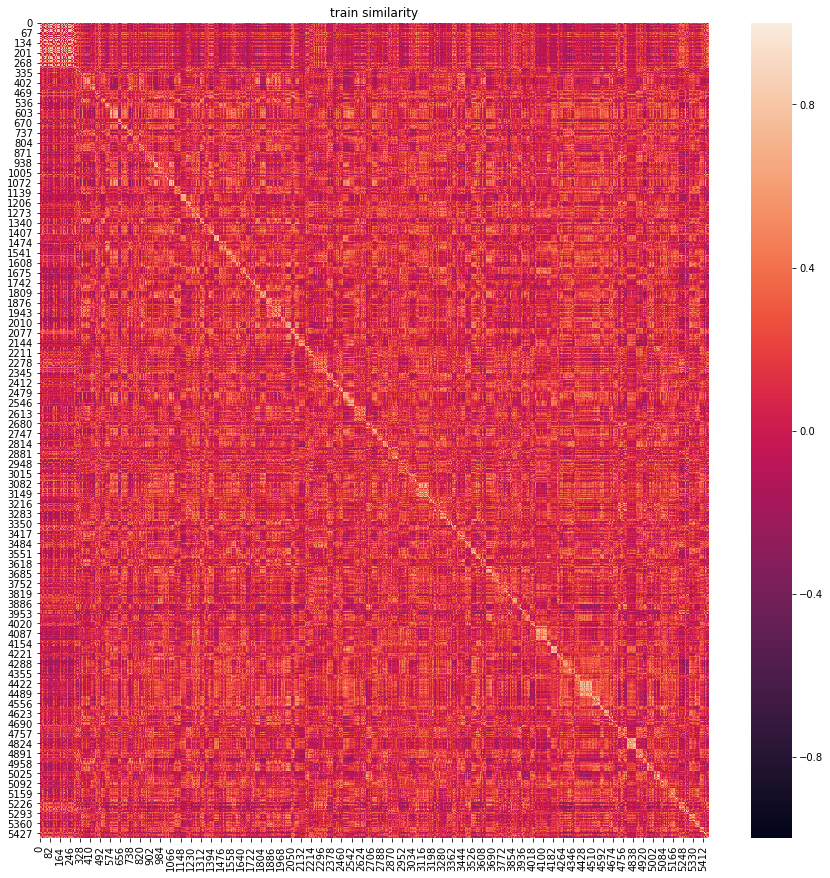

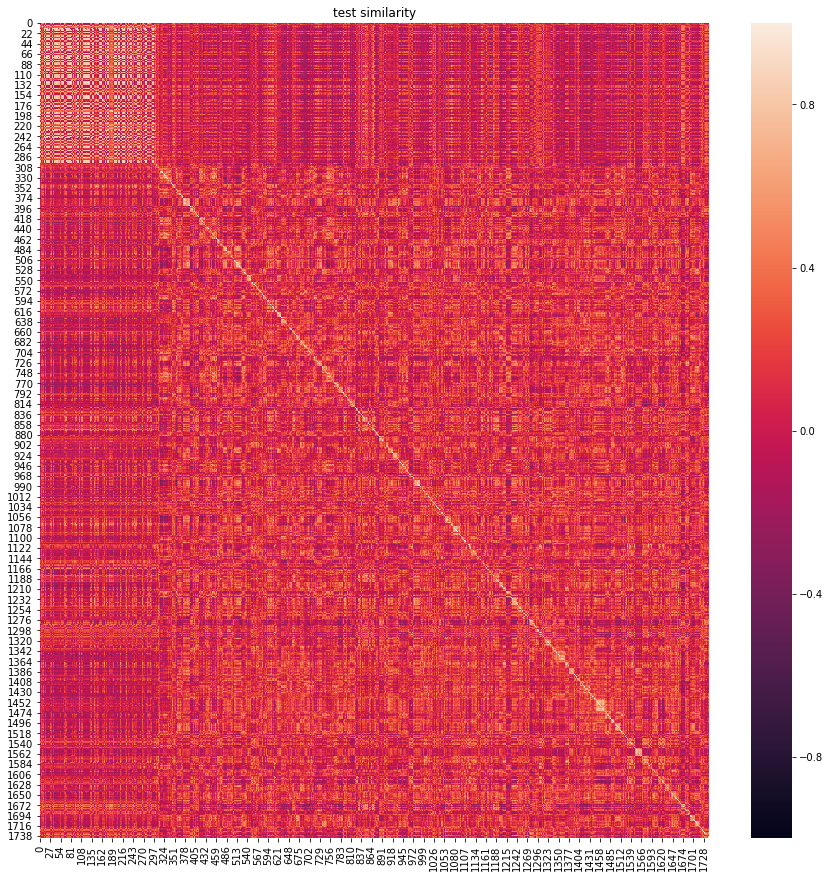

In [45]:
_ = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=100, n_obfuscated=2)

In [18]:
np.abs(sim - sim.T).max()

1.1920929e-07

In [13]:

# trainer_params = dict(
#     n_epochs = 200,
#     n_obfuscated = 25,
#     validate_every = 5,
#     n_problems_validation = 50,
#     validate_n_problems = 50,
#     train_n_problems = 50,
#     regularizer_coef = 0.001,
#     n_adversarial = 100,
#     adversarial_coef = 1
# )


trainer_params = dict(
    n_epochs = 200,
    n_obfuscated = 25,
    validate_every = 5,
    n_problems_validation = 50,
    validate_n_problems = 10,
    train_n_problems = 10,
    regularizer_coef = 0.000,
    n_adversarial = 10,
    adversarial_coef = 1
)


In [14]:
track_metric = {
    "metric_name":"loss",
    "function":ast_train.validate_max
}

In [15]:
# batcher = obfuscated_trainer.Batcher(data, 0.8)
!ls

Anytask-on-GCJ-108.ipynb   most_common_names_all_datasets.pkl
experiments		   obfuscated_trainer.py
GCJ-108.ipynb		   obfuscation.py
GCJ-108-mixing-code.ipynb  __pycache__
GCJ-108-names.ipynb	   training_obfuscated_ast_discriminator.ipynb
mix_code.ipynb


In [16]:
path = "./experiments/gcj_108_108/pure/no_names"
if os.path.exists(path):
    raise ValueError()

ValueError: 

In [17]:
trainer = obfuscated_trainer.Trainer(ast_encoder, torch.optim.Adam(ast_encoder.parameters()), path=path, track_metric=track_metric)

In [18]:
trainer.load(os.path.join(path, "last_state"))

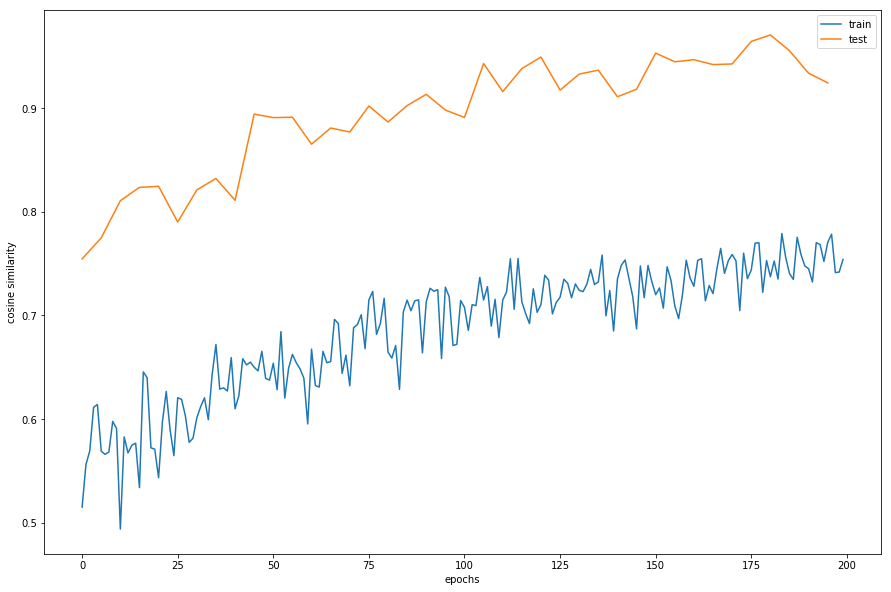

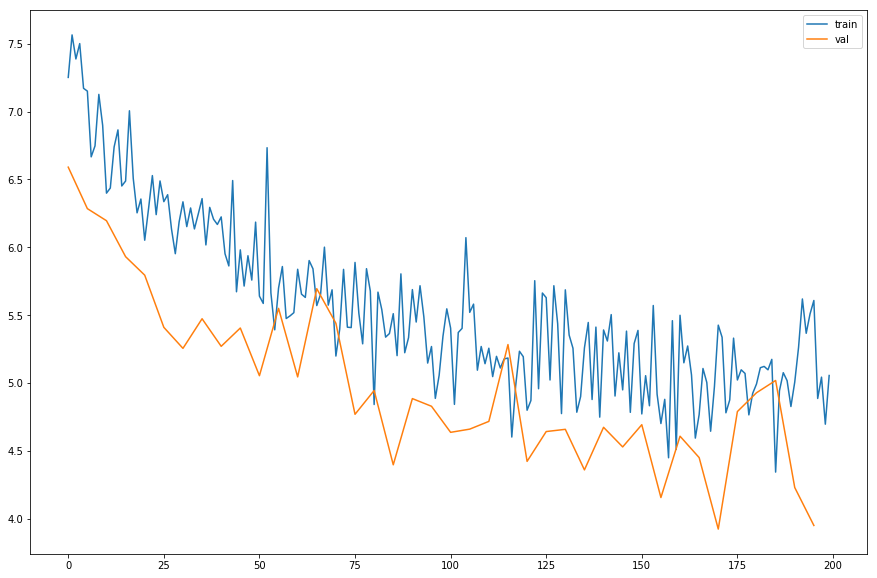

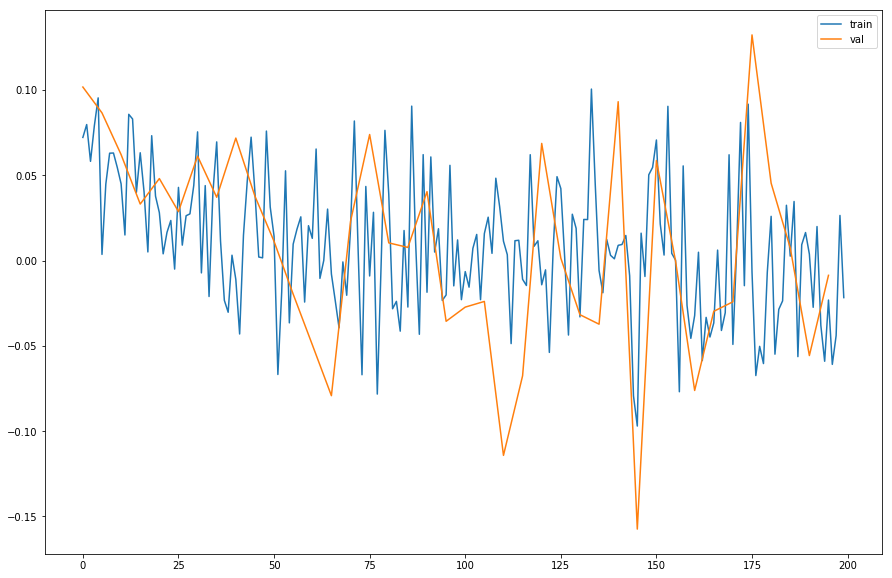

In [19]:
trainer.train(batcher, trainer_params, obfuscation_params)

In [ ]:
validation_result = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=100, n_obfuscated=5)

Test:
0.96
0.8333333333333333
0.9433333333333334


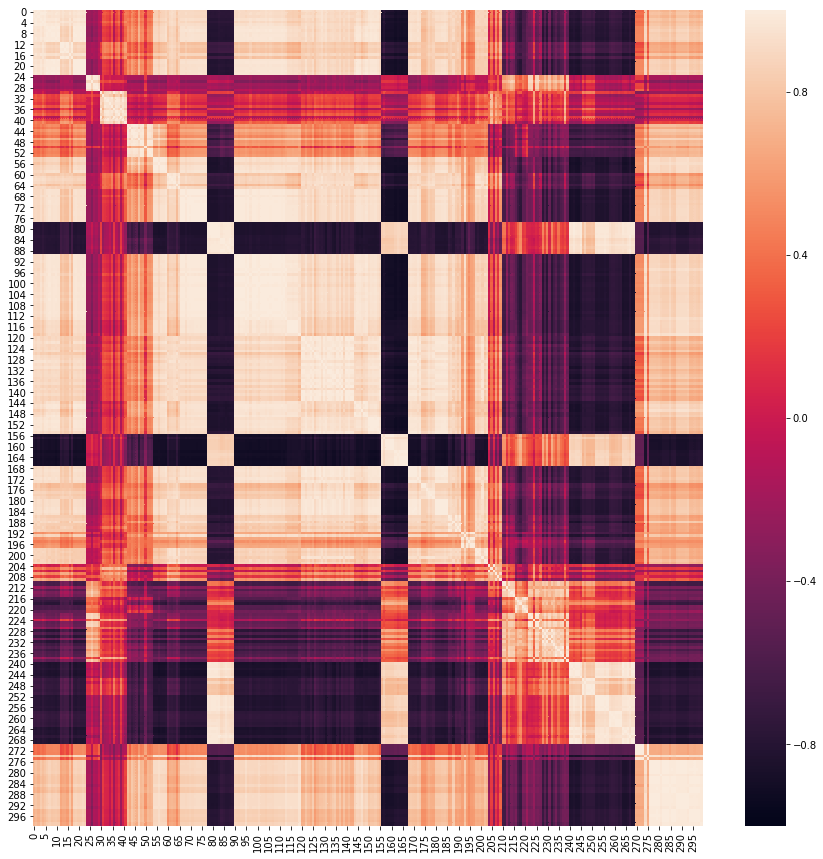

In [20]:
validation_result_old = obfuscated_trainer.validate_old(ast_encoder, batcher, long_names[:10], obfuscation_params, n_first_for_person=5, n_obfuscated=5)

Train:
same_user 0.9424242424242425
same_problem_user 0.784848484848485
same_user_original 1.0
Test:
same_user 0.9515151515151515
same_problem_user 0.7575757575757577
same_user_original 1.0


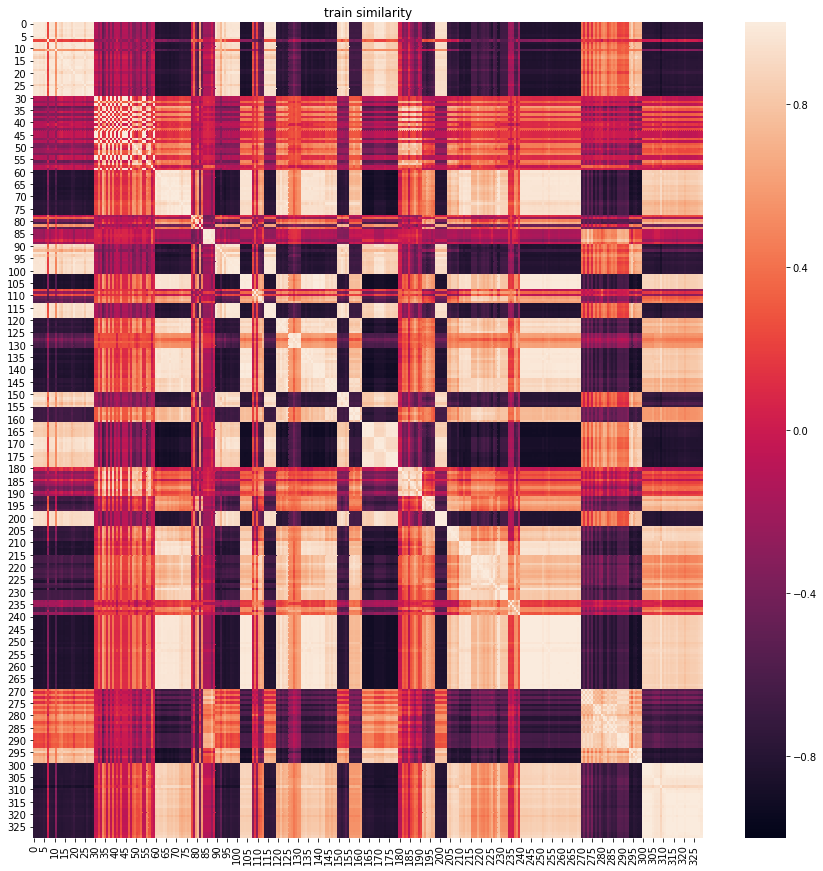

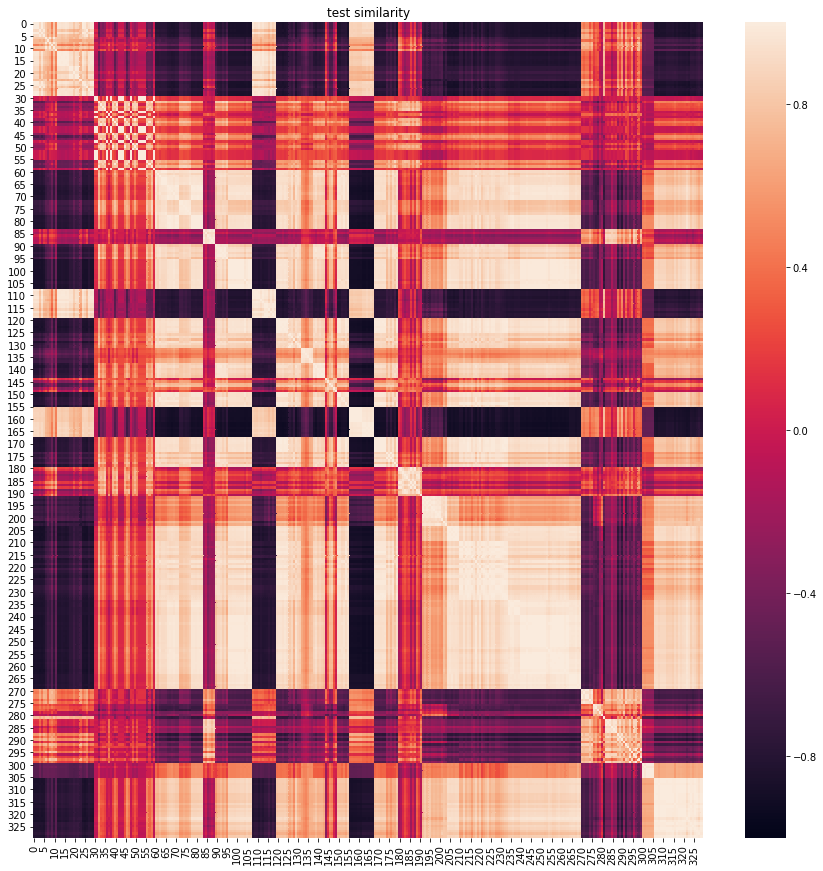

In [28]:
validation_result_new = obfuscated_trainer.validate(ast_encoder, batcher, long_names[:10], obfuscation_params, max_for_user=5, n_obfuscated=5)

In [31]:
validation_result_new[0]["indices"]["__fictional__"]

defaultdict(dict,
            {0: {0: 31, 1: 32, 2: 33, 3: 34, 4: 35, 'original': 30},
             1: {0: 37, 1: 38, 2: 39, 3: 40, 4: 41, 'original': 36},
             2: {0: 43, 1: 44, 2: 45, 3: 46, 4: 47, 'original': 42},
             3: {0: 49, 1: 50, 2: 51, 3: 52, 4: 53, 'original': 48},
             4: {0: 55, 1: 56, 2: 57, 3: 58, 4: 59, 'original': 54}})

In [33]:
validation_result_new[0]["back_indices"][30:60]

[('__fictional__', 0, 'original'),
 ('__fictional__', 0, 0),
 ('__fictional__', 0, 1),
 ('__fictional__', 0, 2),
 ('__fictional__', 0, 3),
 ('__fictional__', 0, 4),
 ('__fictional__', 1, 'original'),
 ('__fictional__', 1, 0),
 ('__fictional__', 1, 1),
 ('__fictional__', 1, 2),
 ('__fictional__', 1, 3),
 ('__fictional__', 1, 4),
 ('__fictional__', 2, 'original'),
 ('__fictional__', 2, 0),
 ('__fictional__', 2, 1),
 ('__fictional__', 2, 2),
 ('__fictional__', 2, 3),
 ('__fictional__', 2, 4),
 ('__fictional__', 3, 'original'),
 ('__fictional__', 3, 0),
 ('__fictional__', 3, 1),
 ('__fictional__', 3, 2),
 ('__fictional__', 3, 3),
 ('__fictional__', 3, 4),
 ('__fictional__', 4, 'original'),
 ('__fictional__', 4, 0),
 ('__fictional__', 4, 1),
 ('__fictional__', 4, 2),
 ('__fictional__', 4, 3),
 ('__fictional__', 4, 4)]

Train:
same_user 0.3081761006289308
same_user_original 0.4867469879518073
same_problem_user 0.213768115942029
Test:
same_user 0.3227777777777778
same_user_original 0.45791666666666664
same_problem_user 0.25675064599483205


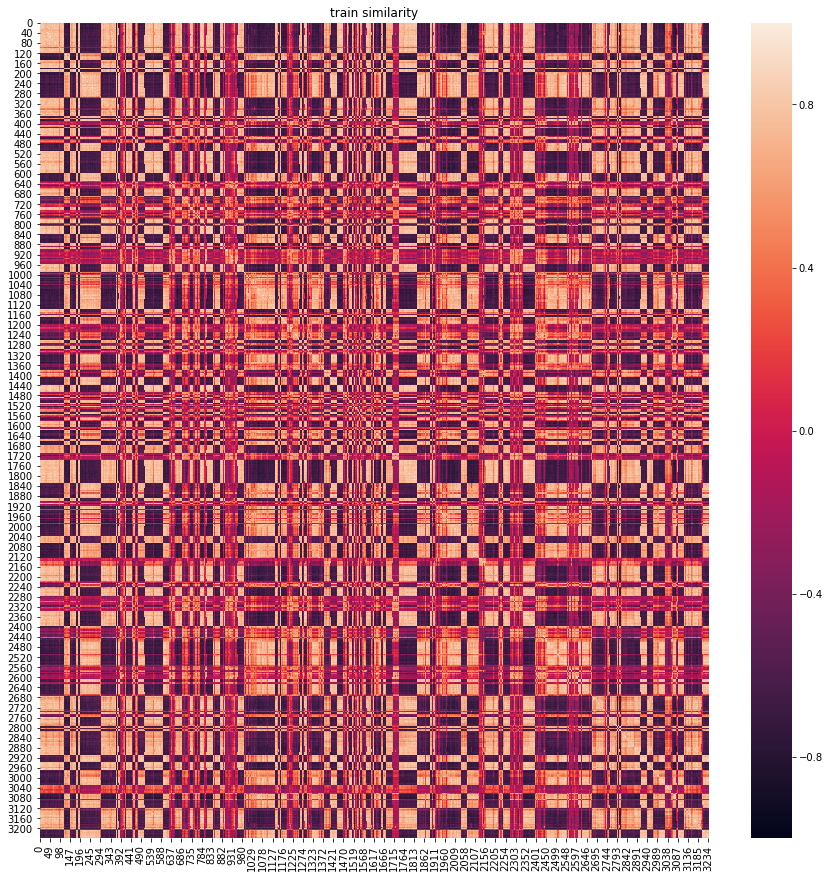

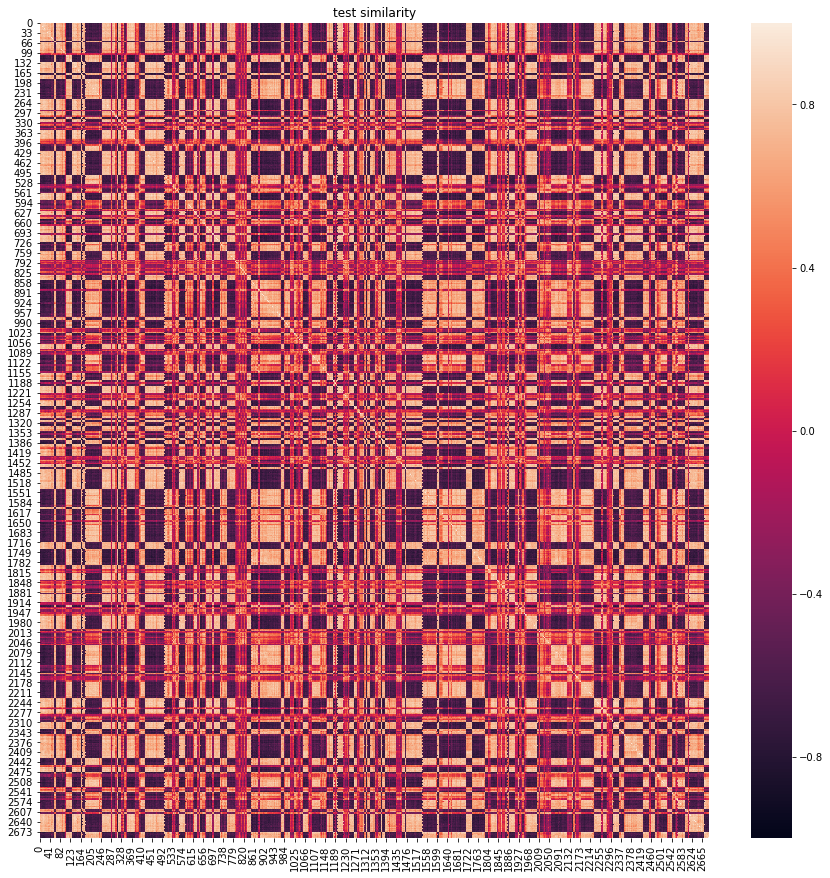

In [62]:
validation_result_2 = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=5, n_obfuscated=5)

Train:
same_user 0.5214407327914768
same_user_original 0.6125999013332668
same_problem_user 0.1480112372487285
Test:
same_user 0.6046924603174603
same_user_original 0.6545238095238096
same_problem_user 0.3312632275132275


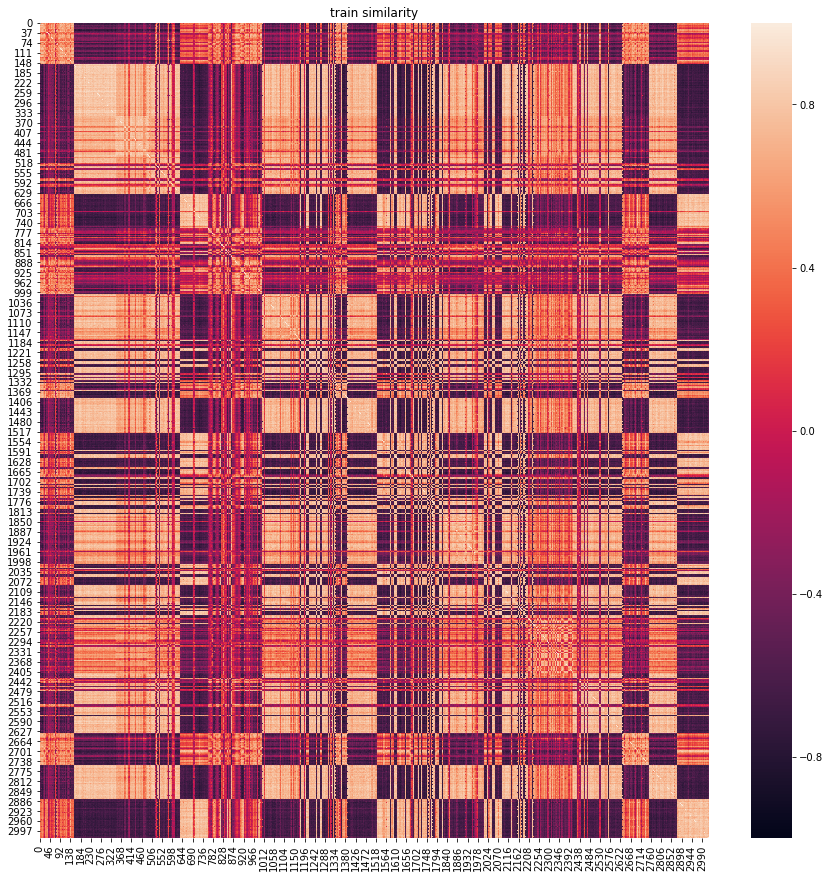

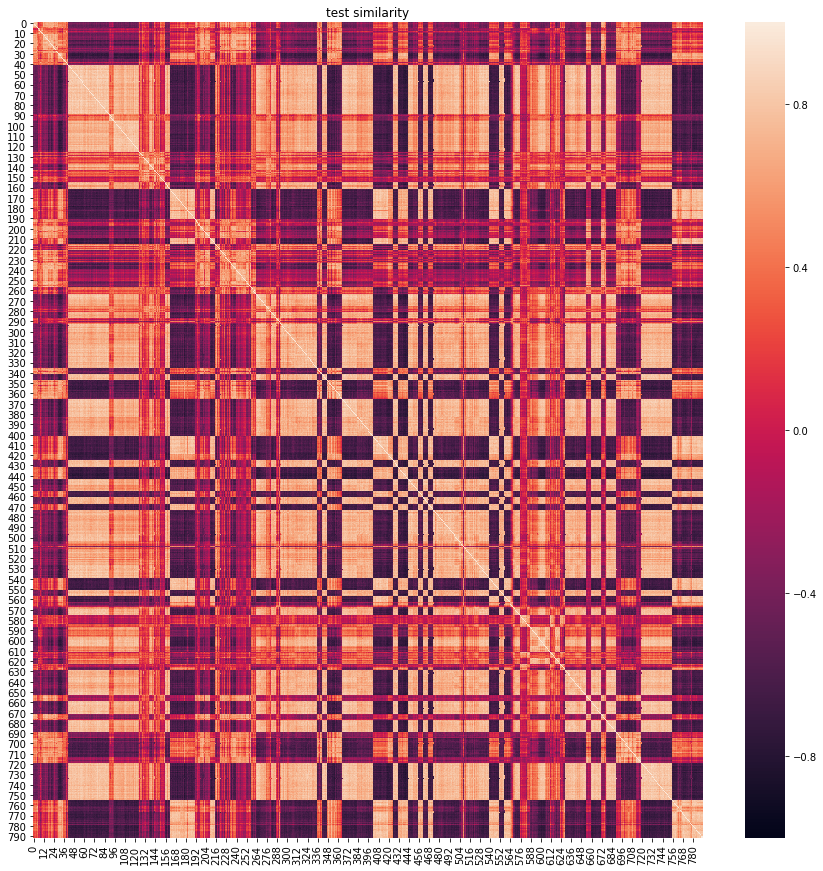

In [60]:
validation_result__ = obfuscated_trainer.validate(ast_encoder, batcher, long_names[:20], obfuscation_params, max_for_user=100, n_obfuscated=5)

In [22]:
# validation_result = obfuscated_trainer.validate(ast_encoder, batcher, long_names, obfuscation_params, max_for_user=100, n_obfuscated=5)

In [23]:
# list(map(lambda x: len(x), validation_result[1]['indices'].values()))

In [39]:
def print_metrics(test_result):
#     print("Test:")
    counters = obfuscated_trainer.calculate_metric_counters(test_result["sim"], test_result["indices"], test_result["back_indices"])
    metrics = obfuscated_trainer.calculate_metrics(counters)
    for metric_name, metric in metrics.items():
        print(metric_name, np.mean(list(metric.values())))

#     plt.figure(figsize=(15, 15))
#     plt.title("test similarity")
#     sns.heatmap(test_result["sim"], vmin=-1.0, vmax=1.0)

In [41]:
print_metrics(validation_result[1])

same_user 0.31376185237571375
same_user_original 0.4932098765432098
same_problem_user 0.24164734557992984


In [43]:
validation_result[1]['back_indices']

[('pawko0', 0, 'original'),
 ('pawko0', 0, 0),
 ('pawko0', 0, 1),
 ('pawko0', 0, 2),
 ('pawko0', 0, 3),
 ('pawko0', 0, 4),
 ('pawko0', 1, 'original'),
 ('pawko0', 1, 0),
 ('pawko0', 1, 1),
 ('pawko0', 1, 2),
 ('pawko0', 1, 3),
 ('pawko0', 1, 4),
 ('pawko0', 2, 'original'),
 ('pawko0', 2, 0),
 ('pawko0', 2, 1),
 ('pawko0', 2, 2),
 ('pawko0', 2, 3),
 ('pawko0', 2, 4),
 ('pawko0', 3, 'original'),
 ('pawko0', 3, 0),
 ('pawko0', 3, 1),
 ('pawko0', 3, 2),
 ('pawko0', 3, 3),
 ('pawko0', 3, 4),
 ('pawko0', 4, 'original'),
 ('pawko0', 4, 0),
 ('pawko0', 4, 1),
 ('pawko0', 4, 2),
 ('pawko0', 4, 3),
 ('pawko0', 4, 4),
 ('pawko0', 5, 'original'),
 ('pawko0', 5, 0),
 ('pawko0', 5, 1),
 ('pawko0', 5, 2),
 ('pawko0', 5, 3),
 ('pawko0', 5, 4),
 ('pawko0', 6, 'original'),
 ('pawko0', 6, 0),
 ('pawko0', 6, 1),
 ('pawko0', 6, 2),
 ('pawko0', 6, 3),
 ('pawko0', 6, 4),
 ('pawko0', 7, 'original'),
 ('pawko0', 7, 0),
 ('pawko0', 7, 1),
 ('pawko0', 7, 2),
 ('pawko0', 7, 3),
 ('pawko0', 7, 4),
 ('Jethol0', 0, 

In [59]:
cur = validation_result[1]
for row_id, row in enumerate(cur['sim']):
    asort = (-row).argsort()
    best = asort[1]
    
    print(cur['back_indices'][row_id], cur['back_indices'][best])
    

('pawko0', 0, 'original') ('argusdusty0', 0, 3)
('pawko0', 0, 0) ('argusdusty0', 2, 0)
('pawko0', 0, 1) ('pawko0', 6, 'original')
('pawko0', 0, 2) ('pawko0', 4, 1)
('pawko0', 0, 3) ('pawko0', 4, 1)
('pawko0', 0, 4) ('Bugloon0', 3, 1)
('pawko0', 1, 'original') ('mgiuca0', 1, 3)
('pawko0', 1, 0) ('pawko0', 2, 4)
('pawko0', 1, 1) ('pawko0', 4, 3)
('pawko0', 1, 2) ('barryd0', 0, 2)
('pawko0', 1, 3) ('mgiuca0', 1, 4)
('pawko0', 1, 4) ('FatAlex0', 3, 2)
('pawko0', 2, 'original') ('bbest0', 3, 2)
('pawko0', 2, 0) ('argusdusty0', 0, 4)
('pawko0', 2, 1) ('bigOnion0', 1, 'original')
('pawko0', 2, 2) ('nobodyisme0', 4, 1)
('pawko0', 2, 3) ('bbest0', 3, 2)
('pawko0', 2, 4) ('pawko0', 0, 0)
('pawko0', 3, 'original') ('pawko0', 7, 'original')
('pawko0', 3, 0) ('VuryLeo0', 1, 3)
('pawko0', 3, 1) ('bbest0', 3, 2)
('pawko0', 3, 2) ('argusdusty0', 3, 1)
('pawko0', 3, 3) ('pawko0', 6, 3)
('pawko0', 3, 4) ('SAPikachu0', 3, 2)
('pawko0', 4, 'original') ('pawko0', 4, 1)
('pawko0', 4, 0) ('pawko0', 7, 'origi

('xithan0', 1, 3) ('argusdusty0', 3, 1)
('xithan0', 1, 4) ('mgiuca0', 0, 1)
('xithan0', 2, 'original') ('mgiuca0', 0, 2)
('xithan0', 2, 0) ('xithan0', 1, 0)
('xithan0', 2, 1) ('j4b0', 1, 'original')
('xithan0', 2, 2) ('argusdusty0', 3, 1)
('xithan0', 2, 3) ('alexamici0', 0, 2)
('xithan0', 2, 4) ('xithan0', 2, 1)
('xithan0', 3, 'original') ('KennethUlrich0', 0, 0)
('xithan0', 3, 0) ('xithan0', 3, 4)
('xithan0', 3, 1) ('rlyeh0', 1, 'original')
('xithan0', 3, 2) ('xithan0', 2, 'original')
('xithan0', 3, 3) ('argusdusty0', 0, 0)
('xithan0', 3, 4) ('xithan0', 3, 0)
('dozingcat0', 0, 'original') ('dozingcat0', 1, 1)
('dozingcat0', 0, 0) ('dozingcat0', 1, 'original')
('dozingcat0', 0, 1) ('ME.py0', 2, 'original')
('dozingcat0', 0, 2) ('dozingcat0', 3, 2)
('dozingcat0', 0, 3) ('ChrisJ0', 0, 0)
('dozingcat0', 0, 4) ('dozingcat0', 3, 2)
('dozingcat0', 1, 'original') ('dozingcat0', 0, 'original')
('dozingcat0', 1, 0) ('dozingcat0', 0, 1)
('dozingcat0', 1, 1) ('Hiking0', 0, 'original')
('dozingcat

('RalfKistner0', 4, 1) ('ali.assaf0', 4, 0)
('RalfKistner0', 4, 2) ('RalfKistner0', 4, 0)
('RalfKistner0', 4, 3) ('RalfKistner0', 4, 0)
('RalfKistner0', 4, 4) ('RalfKistner0', 3, 3)
('barryd0', 0, 'original') ('KennethUlrich0', 0, 1)
('barryd0', 0, 0) ('KennethUlrich0', 3, 4)
('barryd0', 0, 1) ('KennethUlrich0', 1, 0)
('barryd0', 0, 2) ('alexamici0', 1, 'original')
('barryd0', 0, 3) ('zerodot0', 1, 0)
('barryd0', 0, 4) ('ali.assaf0', 5, 4)
('barryd0', 1, 'original') ('barryd0', 1, 4)
('barryd0', 1, 0) ('barryd0', 1, 'original')
('barryd0', 1, 1) ('barryd0', 1, 4)
('barryd0', 1, 2) ('barryd0', 1, 4)
('barryd0', 1, 3) ('barryd0', 1, 2)
('barryd0', 1, 4) ('barryd0', 1, 2)
('barryd0', 2, 'original') ('pawko0', 4, 3)
('barryd0', 2, 0) ('bbest0', 4, 1)
('barryd0', 2, 1) ('barryd0', 3, 1)
('barryd0', 2, 2) ('LouisP0', 3, 3)
('barryd0', 2, 3) ('chuck0', 0, 2)
('barryd0', 2, 4) ('Jethol0', 2, 4)
('barryd0', 3, 'original') ('pawko0', 5, 4)
('barryd0', 3, 0) ('QuentinB0', 0, 2)
('barryd0', 3, 1) 

('waynerad0', 1, 'original') ('dareonion0', 4, 0)
('waynerad0', 1, 0) ('farin0', 3, 'original')
('waynerad0', 1, 1) ('waynerad0', 0, 4)
('waynerad0', 1, 2) ('waynerad0', 1, 1)
('waynerad0', 1, 3) ('farin0', 3, 1)
('waynerad0', 1, 4) ('waynerad0', 0, 4)
('waynerad0', 2, 'original') ('lidaobing0', 2, 3)
('waynerad0', 2, 0) ('VuryLeo0', 1, 3)
('waynerad0', 2, 1) ('bigOnion0', 0, 0)
('waynerad0', 2, 2) ('nobodyisme0', 3, 0)
('waynerad0', 2, 3) ('waynerad0', 3, 3)
('waynerad0', 2, 4) ('waitingkuo05270', 0, 3)
('waynerad0', 3, 'original') ('d.operator0', 0, 3)
('waynerad0', 3, 0) ('xithan0', 1, 2)
('waynerad0', 3, 1) ('Peter.Smit0', 1, 0)
('waynerad0', 3, 2) ('pawko0', 7, 'original')
('waynerad0', 3, 3) ('nobodyisme0', 0, 4)
('waynerad0', 3, 4) ('JustinKang0', 0, 3)
('Sibi0', 0, 'original') ('schapel0', 3, 1)
('Sibi0', 0, 0) ('Taizo0', 2, 'original')
('Sibi0', 0, 1) ('Sibi0', 0, 4)
('Sibi0', 0, 2) ('Sibi0', 0, 1)
('Sibi0', 0, 3) ('Sibi0', 0, 1)
('Sibi0', 0, 4) ('Sibi0', 0, 1)
('Sibi0', 1, 'o

('Fizu0', 0, 3) ('gsz0', 1, 4)
('Fizu0', 0, 4) ('Kabie0', 2, 1)
('Fizu0', 1, 'original') ('ali.assaf0', 0, 1)
('Fizu0', 1, 0) ('EricStansifer0', 5, 'original')
('Fizu0', 1, 1) ('FatAlex0', 3, 0)
('Fizu0', 1, 2) ('Fizu0', 1, 3)
('Fizu0', 1, 3) ('Fizu0', 1, 2)
('Fizu0', 1, 4) ('dareonion0', 4, 3)
('Fizu0', 2, 'original') ('argusdusty0', 2, 4)
('Fizu0', 2, 0) ('pawko0', 5, 4)
('Fizu0', 2, 1) ('bbest0', 3, 2)
('Fizu0', 2, 2) ('waitingkuo05270', 3, 3)
('Fizu0', 2, 3) ('ali.assaf0', 9, 0)
('Fizu0', 2, 4) ('Fizu0', 2, 1)
('Fizu0', 3, 'original') ('Fizu0', 3, 1)
('Fizu0', 3, 0) ('Kabie0', 2, 2)
('Fizu0', 3, 1) ('j4b0', 1, 'original')
('Fizu0', 3, 2) ('takluyver0', 0, 2)
('Fizu0', 3, 3) ('gsz0', 1, 4)
('Fizu0', 3, 4) ('FatAlex0', 3, 2)
('diver0', 0, 'original') ('diver0', 0, 3)
('diver0', 0, 0) ('Sibi0', 0, 1)
('diver0', 0, 1) ('ronnodas0', 5, 4)
('diver0', 0, 2) ('ChrisJ0', 1, 3)
('diver0', 0, 3) ('Sibi0', 0, 1)
('diver0', 0, 4) ('RalfKistner0', 0, 2)
('diver0', 1, 'original') ('Ardem0', 2, 0)

In [26]:
list(map(lambda x: len(x), validation_result[1]['metrics'].values()))

[101, 81, 89]

In [26]:
import gc
gc.collect()

71

In [ ]:
result = obfuscated_trainer.compare_cos(ast_encoder, batcher.test_data, np.mean)